In [1]:
%matplotlib inline
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re
import util
from model import AffineNet
from model import NetMain
import train

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
path = "DATA_FINAL/"

# load the dataset
dataset = np.load(path+'dataset.npz')

imgs_rgb = dataset['rgb']
imgs_ir = dataset['ir']
imgs_mask_rgb = dataset['mask_rgb']
imgs_mask_ir = dataset['mask_ir']

print(imgs_rgb.shape, imgs_ir.shape, imgs_mask_rgb.shape, imgs_mask_ir.shape)

(10431, 240, 320, 3) (10431, 240, 320, 3) (10431, 240, 320) (10431, 240, 320)


In [3]:
vol_size = imgs_mask_rgb.shape[1:]
model = NetMain(vol_size).to(device)

In [4]:
beg = 1000
end = 2000

# prepare the frames to be used in the voxelmorph network (use only frames [1000:2000])
imRGB = util.parseImages(imgs_mask_rgb, end)
imRGB = imRGB[beg:end, ...]

imIR = util.parseImages(imgs_mask_ir, end)
imIR = imIR[beg:end, ...]

imIR.shape, imRGB.shape

(torch.Size([1000, 1, 240, 320]), torch.Size([1000, 1, 240, 320]))

In [5]:
mini_batch_size = 20
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [13]:
model = model.to(device)

# train model with 20 epochs
train.train2(model, imRGB, imIR, 20, mini_batch_size, criterion, optimizer, 'netmain', 0.6)

epoch 1: loss = 3.7220134865492582
epoch 2: loss = 3.6862332951277494
epoch 3: loss = 3.649079345166683
epoch 4: loss = 3.621697189286351
epoch 5: loss = 3.5897951051592827
epoch 6: loss = 3.5550675988197327
epoch 7: loss = 3.528432572260499
epoch 8: loss = 3.5030078385025263
epoch 9: loss = 3.471623593941331
epoch 10: loss = 3.441669911146164
epoch 11: loss = 3.417449524626136
epoch 12: loss = 3.389767335727811
epoch 13: loss = 3.3644478116184473
epoch 14: loss = 3.3350356593728065
epoch 15: loss = 3.3126462250947952
epoch 16: loss = 3.293029360473156
epoch 17: loss = 3.2770289219915867
epoch 18: loss = 3.259491216391325
epoch 19: loss = 3.2419020123779774
epoch 20: loss = 3.2246494479477406


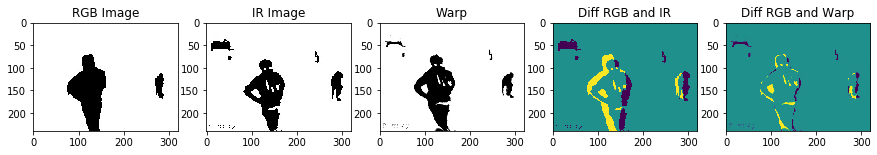

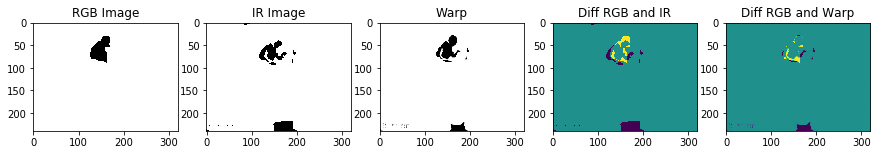

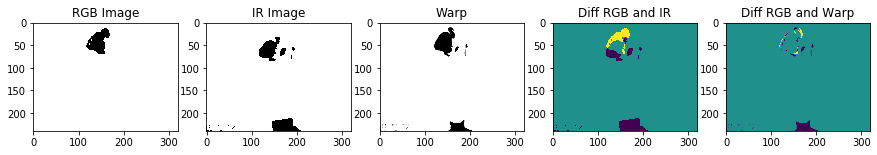

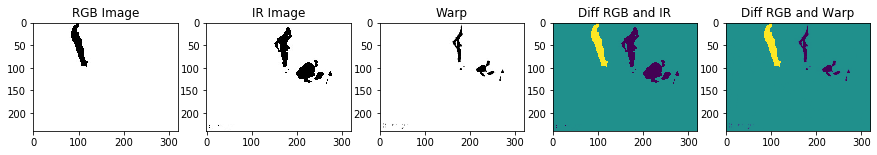

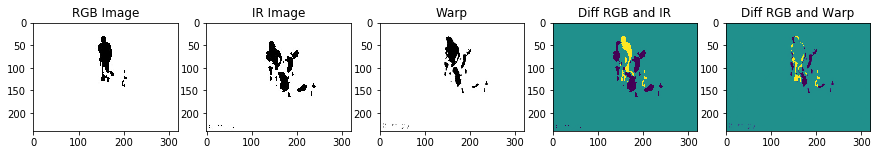

...

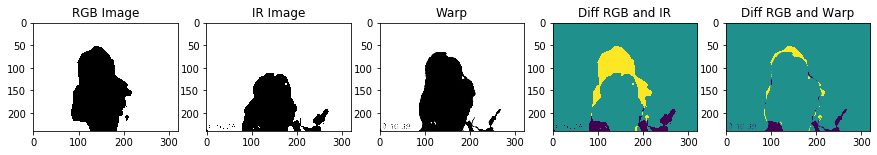

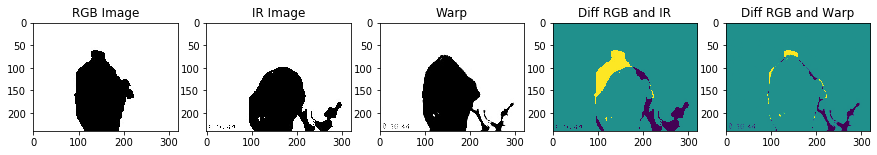

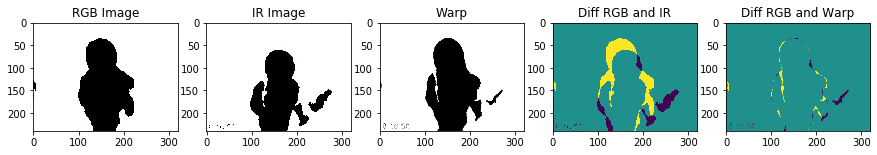

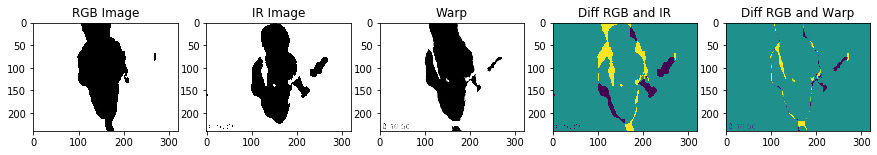

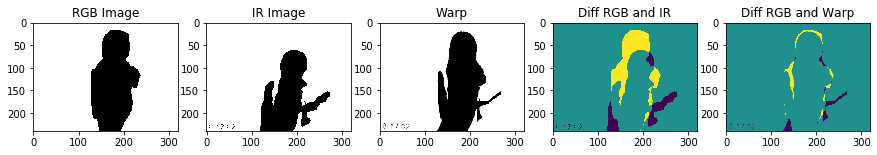

In [14]:
# print results with the masks
for i in range(0, 1000, 50):
    util.printResult(*util.getImagesById2(imRGB.cpu(), imIR.cpu(), i, model.cpu()), cmap='viridis')

In [15]:
# load all the flows (to apply on the original frames)
flows = util.getAllFlows_netMain(imIR, imRGB, model)

In [16]:
# apply the flows to the original frames
x = util.applyFlowToColoredImages_netMain(imgs_ir, flows, 1000, 2000, model)

In [17]:
# superpose the rgb and ir frames (before registration and after registration)
superposedImages = util.superposeTwoImages(imgs_rgb[1000:2000], (x*255).astype('uint8'))
superposedImages2 = util.superposeTwoImages(imgs_rgb[1000:2000], imgs_ir[1000:2000])
print(superposedImages.shape, superposedImages2.shape)

(1000, 240, 320, 3) (1000, 240, 320, 3)


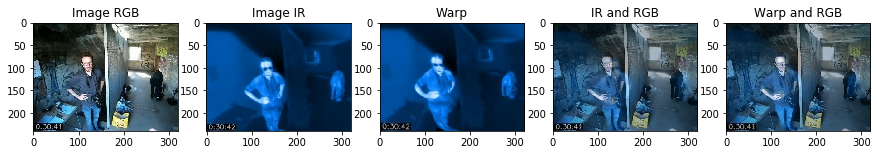

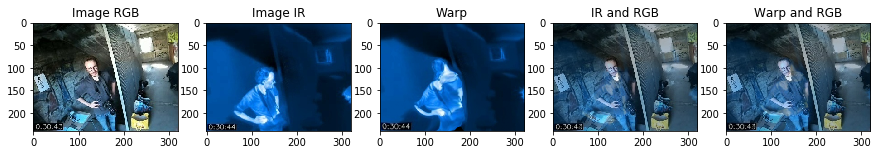

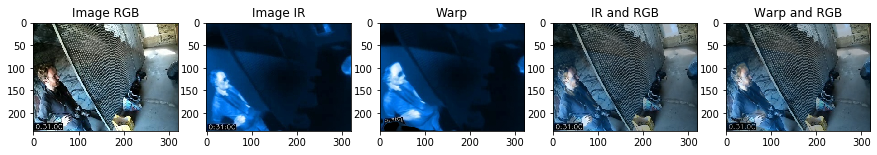

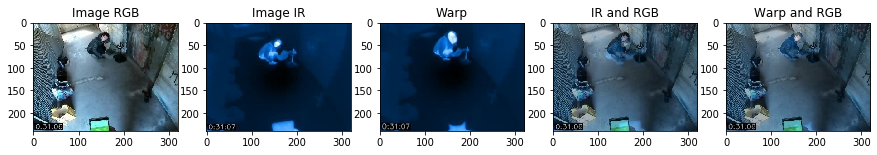

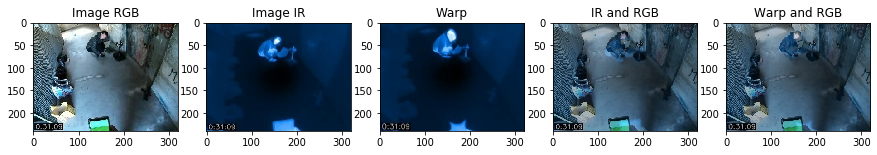

...

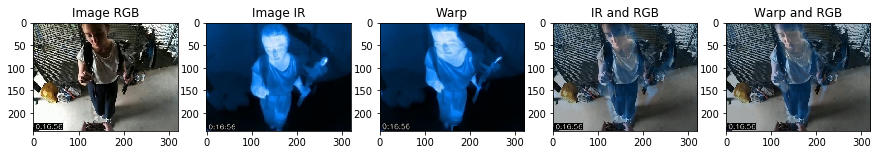

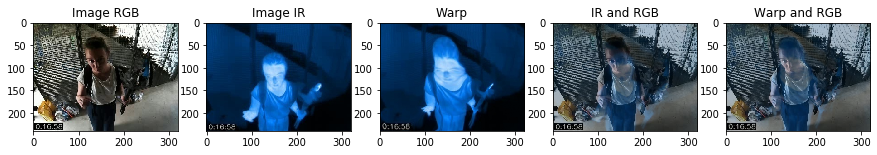

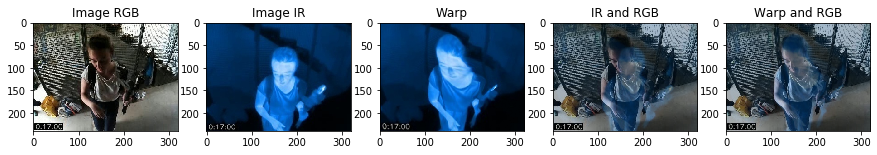

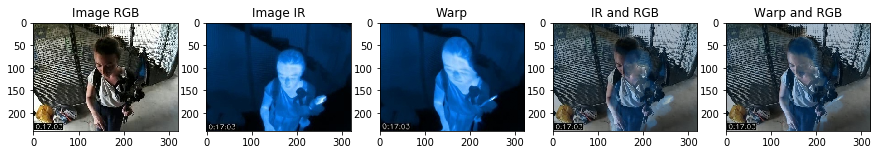

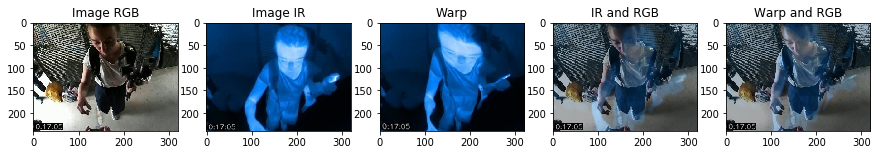

In [18]:
# print the results on the original frames
for i in range(0, 1000, 20):
    util.printFinal(x[i], imgs_rgb[1000+i], imgs_ir[1000+i], superposedImages[i], superposedImages2[i])

In [ ]:
# save these frames in video
util.saveVideo(superposedImages2, 13.0, 320, 240, 'ir_rgb.avi')